In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# 1. Cài và import các thư viện cần thiết

In [2]:
!pip install nibabel -q
!pip install scikit-learn -q
!pip install tifffile -q
!pip install tqdm -q
!pip install split-folders -q
!pip install torchinfo -q
!pip install segmentation-models-pytorch-3d -q
!pip install livelossplot -q
!pip install torchmetrics -q
!pip install tensorboard -q
# !pip install torchio -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.0/121.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 35.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.8/626.8 kB 26.9 MB/s eta 0:00:00


In [3]:
import os
import random
import splitfolders
from tqdm import tqdm
import nibabel as nib
import glob
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import shutil
import time

from dataclasses import dataclass

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
import torchvision.transforms as transforms
from torch.cuda import amp

from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassAccuracy

from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchinfo import summary
import gc

import segmentation_models_pytorch_3d as smp

from livelossplot import PlotLosses
from livelossplot.outputs import MatplotlibPlot, ExtremaPrinter


# 4. Tạo dataloader

* Dataset của Pytorch: 
* DataLoader của Pytorch: 

In [4]:
class BraTs2023Dataset(Dataset):
    def __init__(self, 
                 img_list: list[str],
                 mask_list: list[str],
                 is_norm: bool=True
                ):
        super().__init__()
        self.img_list = sorted(img_list)
        self.mask_list = sorted(mask_list)
        if is_norm:
            self.normalizer = transforms.Normalize(mean=[0.5], std=[0.5])

    def _load_image(self, path_image: str) -> np.ndarray: 
        image = np.load(path_image)
        return image

    def __len__(self) -> int:
        return len(self.img_list)

    def __getitem__(self, index: int):
        path_img = self.img_list[index]
        path_mask = self.mask_list[index]

        # load ảnh và mask
        image = self._load_image(path_img)
        mask = self._load_image(path_mask)

        # chuyển shape ảnh về dạng [C, D, H, W], shape đang có dạng [H, W, D, C]-> điều này cần thiết cho model
        image = torch.from_numpy(image).permute(3, 2, 0, 1).float()
        mask = torch.from_numpy(mask).permute(3, 2, 0, 1)

        # chuẩn hóa ảnh 
        if self.normalizer:
            image = self.normalizer(image)
        return image, mask

In [5]:
train_img_list = []
train_mask_list = []
val_img_list = []
val_mask_list = []


TRAIN_DIR = "/kaggle/input/brats2023-preprocessed-v"
VAL_DIR = "/kaggle/input/brats2023-validation"


for i in [0, 1, 3, 4]:
    folder_path = TRAIN_DIR + str(i)
    items = os.listdir(folder_path)

    image_folder = os.path.join(folder_path, items[0])
    for image_name in os.listdir(image_folder):
        train_img_list.append(os.path.join(image_folder, image_name)) # append tất cả đường dẫn ảnh vào img_list

    mask_folder = os.path.join(folder_path, items[1])
    for mask_name in os.listdir(mask_folder):
        train_mask_list.append(os.path.join(mask_folder, mask_name)) # append tất cả đường dẫn mask vào img_list



folders = os.listdir(VAL_DIR)
folder_img_dir = os.path.join(VAL_DIR, folders[0])
folder_mask_dir = os.path.join(VAL_DIR, folders[1])

for img_name in os.listdir(folder_img_dir):
    path_img = os.path.join(folder_img_dir, img_name)
    val_img_list.append(path_img)

for mask_name in os.listdir(folder_mask_dir):
    path_mask = os.path.join(folder_mask_dir, mask_name)
    val_mask_list.append(path_mask)


print(len(train_img_list))
print(len(train_mask_list))

print(len(val_img_list))
print(len(val_mask_list))

574
574
85
85


In [6]:
train_dataset = BraTs2023Dataset(train_img_list, train_mask_list)
val_dataset = BraTs2023Dataset(val_img_list, val_mask_list)

print(train_dataset[i][0].shape)
print(train_dataset[i][1].shape)


print(val_dataset[i][0].shape)
print(val_dataset[i][1].shape)

torch.Size([3, 128, 128, 128])
torch.Size([4, 128, 128, 128])
torch.Size([3, 128, 128, 128])
torch.Size([4, 128, 128, 128])


In [7]:
train_loader = DataLoader(train_dataset, batch_size = 4, shuffle = True, num_workers = 4)
val_loader = DataLoader(train_dataset, batch_size = 4, shuffle = True, num_workers = 4) 
sample = next(iter(train_loader))
image, mask = sample
print(image.shape) # [B, C, D, H, W]
print(mask.shape) # [B, C, D, H, W]

torch.Size([4, 3, 128, 128, 128])
torch.Size([4, 4, 128, 128, 128])


# 5. Trực quan hóa ảnh và mask từ DataLoader
Đảm bảo data qua quá trình xử lý không có lỗi xảy ra 

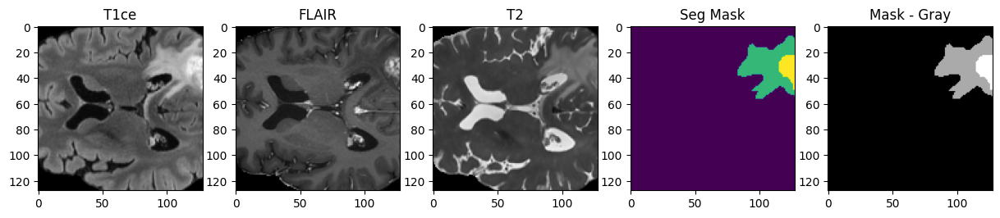

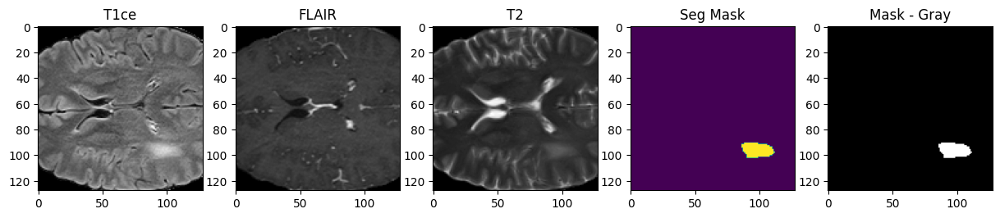

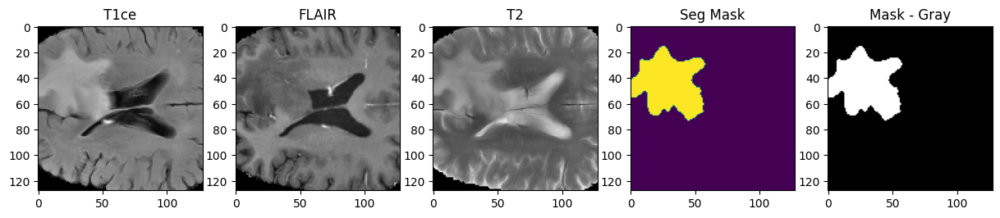

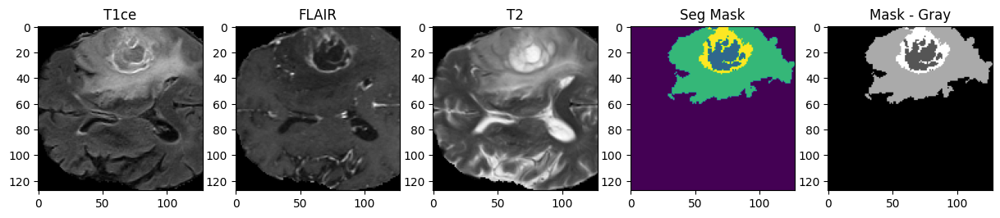

In [8]:
def visualize_slices(images, masks, num_slices=20):
    batch_size = min(images.shape[0], 4)
    
    masks = torch.argmax(masks, dim=1) #along the channel/class dim
    
    for i in range(min(num_slices, batch_size)):
        fig,ax = plt.subplots(1,5,figsize = (15,5))
        
        middle_slice = images.shape[2] // 2
        ax[0].imshow(images[i,0, middle_slice,:,:], cmap = 'gray')
        ax[1].imshow(images[i, 1, middle_slice, : ,:], cmap = 'gray')
        ax[2].imshow(images[i, 2, middle_slice, :, :], cmap = 'gray')
        ax[3].imshow(masks[i, middle_slice, : ,:], cmap = 'viridis')
        ax[4].imshow(masks[i, middle_slice, : ,:], cmap = 'gray')

        
        ax[0].set_title('T1ce')
        ax[1].set_title('FLAIR')
        ax[2].set_title('T2')
        ax[3].set_title('Seg Mask')
        ax[4].set_title('Mask - Gray')
        
        plt.show()

visualize_slices(image, mask, num_slices = 20)

# 6. Xây dựng model 3D Unet + Transformer từ đầu

[MONAI Model Zoo](https://monai.io/model-zoo.html) cung cấp nhiều pre-trained cho lĩnh vực y tế trên tập dữ liệu BraTS2018. Chúng ta có thể fine-tuning các model ở đây để có độ chính xác cao, tuy nhiên ở đây chúng ta sẽ xây dựng 2 kiến trúc Unet và Transformer và training model từ đầu để phục vụ cho quá trình học tập 

## 6.1 Giới thiệu về Unet

U-Net là một mô hình deep learning phổ biến dùng trong image segmentation, đặc biệt là trong lĩnh vực y tế (như phân đoạn khối u não, mô phổi, v.v.).

📌 Được giới thiệu bởi Olaf Ronneberger vào năm 2015, U-Net đã trở thành tiêu chuẩn trong Medical Image Segmentation do khả năng học hiệu quả từ dữ liệu ít và cho ra kết quả tốt.

📄 Paper gốc: ["U-Net: Convolutional Networks for Biomedical Image Segmentation"](https://arxiv.org/abs/1505.04597)

### Kiến trúc của và các điểm chính của mô hình
U-Net có dạng hình chữ U, gồm hai phần chính:

a. Encoder (Contraction Path) sử dụng các lớp Convolution + ReLU + MaxPooling để:

    * Trích xuất đặc trưng từ ảnh đầu vào.
    
    * Giảm kích thước không gian (spatial size) của ảnh nhưng tăng chiều kênh (channels) để nắm bắt thông tin trừu tượng hơn.
    
    * Loại bỏ nhiễu không quan trọng, chỉ giữ lại những đặc trưng cần thiết cho segmentation.
    
    * Lợi ích: 
       - Giúp mô hình hiểu ngữ cảnh toàn cục của ảnh.
       - Giúp phân biệt giữa các đối tượng và nền.

b. Decoder (Expansion Path) sử dụng Upsampling + Convolution để:

    * Khôi phục lại kích thước ảnh về như ban đầu.
    
    * Kết hợp thông tin trích xuất từ encoder với các đặc trưng chi tiết hơn.
    
    * Dự đoán nhãn (class) cho từng pixel.

    * Lợi ích:
        - Phục hồi lại chi tiết hình ảnh để đạt segmentation chính xác.
        - Kết hợp với Encoder để giữ lại ngữ cảnh và thông tin vị trí.

c. Các skip connections nối trực tiếp các feature maps từ encoder → decoder, giúp mô hình:

    * Giữ lại thông tin chi tiết từ ảnh gốc.
    
    * Giảm mất mát thông tin do MaxPooling.
    
    * Tăng độ chính xác khi phân đoạn các biên vật thể nhỏ.
    
    * Lợi ích:
        - Giúp mô hình phân đoạn các đối tượng nhỏ hoặc có biên phức tạp (ví dụ: mạch máu, khối u não).
        - Giải quyết vấn đề vanishing gradient, giúp mô hình hội tụ tốt hơn

d. Kết hợp cả thông tin cục bộ và toàn cục

    * Encoder học thông tin toàn cục (bằng cách giảm kích thước ảnh dần dần).
    
    * Decoder học thông tin cục bộ (bằng cách phục hồi thông tin chi tiết).
    
    * Skip connections giúp kết hợp cả hai loại thông tin này.
    
    * Lợi ích:
        - Giúp mô hình vừa nhận diện được cấu trúc tổng thể, vừa bảo toàn được chi tiết trong ảnh.
        - Giảm lỗi segmentation ở các vùng phức tạp.

e. U-Net hoạt động tốt với dữ liệu ít

    * Do có skip connections và kiến trúc cân đối, U-Net có thể hoạt động tốt ngay cả khi không có nhiều dữ liệu huấn luyện.
    
    * Các mô hình segmentation khác như FCN, DeepLab thường yêu cầu tập dữ liệu lớn hơn.
    * Lợi ích: Rất phù hợp cho các bài toán y tế, nơi dữ liệu thường bị hạn chế.

f. Các biến thể của U-Net

    - 3D U-Net → Dùng cho dữ liệu ảnh y tế 3D.
    - Attention U-Net → Thêm Attention Mechanism để tập trung vào vùng quan trọng.
    - U-Net++ → Thêm nhiều skip connections và kiến trúc phức tạp hơn.
    - Swin U-Net → Kết hợp Transformer để cải thiện khả năng nhận dạng vùng cần segment.

g. Ứng dụng của U-Net

U-Net đặc biệt mạnh trong các bài toán image segmentation như:

    * Phân đoạn khối u não từ MRI (BraTS Challenge)
    * Phân vùng phổi từ ảnh CT
    * Phát hiện tổn thương võng mạc từ ảnh fundus
    * Phân đoạn tế bào trong sinh thiết mô
    * Phát hiện đường biên vật thể trong ảnh vệ tinh

![Unet Architecture](https://media.licdn.com/dms/image/D4E12AQE2EGFFHgDVyw/article-cover_image-shrink_720_1280/0/1711127950444?e=2147483647&v=beta&t=CAMRHi17pNWtBFyfO5pRjYaL_MEEY2lPJBr643pL7p0)

## 5.2 Giới thiệu Transformer

Transformers là một kiến trúc mạng deep learning mạnh mẽ, đặc biệt trong xử lý ngôn ngữ tự nhiên (NLP) và thị giác máy tính (CV). Chúng đã thay thế các mô hình truyền thống như RNN, LSTM, CNN và trở thành tiêu chuẩn trong các bài toán machine learning hiện đại.

Ngày nay mọi chatbot như GPT, Gemini, Claude... được dựa trên kiến trúc này để xử lý ngôn ngữ tự nhiên

Paper gốc: ["Attention Is All You Need" (Google, 2017)](https://arxiv.org/abs/1706.03762)

![Transformer Architecture](https://media.geeksforgeeks.org/wp-content/uploads/20240524112538/Screenshot-2024-05-24-112357-768.png)

### Các thành phần trong Transformer
### 1. Self Attention - sự thành công của Transformer
### 2. Multi-head Attention
### 3. Scaled Dot-Product Attention
### 4. Positional Embbeding
### 5. Feed-Forward

## 5.3 Coding Transformers

### 5.3.1 Lớp patch etractor giúp chia ảnh thành các patchs

In [9]:
# Patch Embedding: Chia dữ liệu thành patch và nhúng thành vector
class PatchEmbed3D(nn.Module):
    def __init__(self, in_channels, image_size, patch_size, d_model, dropout: float=0.1):
        super().__init__()

        assert image_size % patch_size == 0, "Tensor dimensions must be divisible by patch_size"
        
        n_patches = (image_size*image_size*image_size) // (patch_size*patch_size*patch_size)
        self.patch_size = patch_size
        self.proj = nn.Conv3d(
            in_channels=in_channels, 
            out_channels=d_model,
            kernel_size=(patch_size, patch_size, patch_size),
            stride=(patch_size, patch_size, patch_size)
        )
        self.position_embeddings = nn.Parameter(torch.zeros(1, n_patches, d_model))
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2)
        x = x.transpose(-1, -2)
        embeddings = x + self.position_embeddings
        embeddings = self.dropout(embeddings)
        return embeddings

patcher = PatchEmbed3D(3, 128, 16, 64)
x = torch.randn(1, 3, 128, 128, 128)
output = patcher(x)
print(output.shape)


torch.Size([1, 512, 64])


### 5.3.2 Multi-head attention

In [10]:


class MultiHeadAttention(nn.Module):
    def __init__(self, d_model: int, num_heads: int, dropout: float = 0.05,):
        super().__init__()

        assert d_model % num_heads == 0, "d_model must be divisible by num_heads"
        self.d_model = d_model
        self.num_heads = num_heads
        self.head_dim = d_model // num_heads

        self.Wq = nn.Linear(in_features=d_model, out_features=d_model, bias=False)
        self.Wk = nn.Linear(in_features=d_model, out_features=d_model, bias=False)
        self.Wv = nn.Linear(in_features=d_model, out_features=d_model, bias=False)
        self.Wo = nn.Linear(in_features=d_model, out_features=d_model, bias=False)

        self.dropout = nn.Dropout(p=dropout)

    def split_heads(self, x: torch.Tensor):
        batch_size, seq_len, d_model = x.size()
        return x.view(batch_size, self.num_heads, seq_len, self.head_dim)
    
    def scaled_dot_product_attention(self, Q: torch.Tensor, K: torch.Tensor, V: torch.Tensor):
        matmul_QK = torch.matmul(Q, K.transpose(2, 3)) # [N, num_heads, seq_len, seq_len]
        dk = torch.tensor(K.size(-1), dtype=K.dtype, device=K.device)
        scaled_dot_product = matmul_QK / dk # [N, num_heads, seq_len, seq_len]

        attention_weights = F.softmax(scaled_dot_product, dim=-1) # [N, num_heads, seq_len, seq_len]
        # [N, num_heads, seq_len, seq_len] @  [N, num_heads, seq_len, head_dim] = [N, num_heads, seq_len, head_dim]
        output = torch.matmul(attention_weights, V)
        return attention_weights, output

    def forward(self, x: torch.Tensor):
        # x: [N, seq_len, d_model]
        batch_size, seq_len, d_model = x.size()
        # [N, seq_len, d_model] => [N, seq_len, d_model] => [N, num_heads, seq_len, head_dim]
        Q = self.split_heads(self.Wq(x)) 
        K = self.split_heads(self.Wk(x))
        V = self.split_heads(self.Wv(x))

        output = F.scaled_dot_product_attention(Q, K, V)
        # [N, num_heads, seq_len, head_dim] => [N, seq_len, num_heads, head_dim] => [N, seq_len, d_model]
        output = output.transpose(1, 2).contiguous().view(batch_size, seq_len, d_model)
        A = self.Wo(output)
        return A # [N, seq_len, d_model]

### 5.3.3 Lớp Feed forward

In [11]:
class FeedForward(nn.Module):
    def __init__(self, d_model: int, projection_dim: int):
        super().__init__()
        self.ffn = nn.Sequential(
            nn.Linear(in_features=d_model, out_features=projection_dim), 
            nn.GELU(),
            nn.Linear(in_features=projection_dim, out_features=d_model)
        )

    def forward(self, x: torch.Tensor):
        # x: [N, seq_len, d_model]
        return self.ffn(x)

### 5.3.4 Khối Unet Transformer Encoder

In [12]:
class TransformerBlock(nn.Module):
    def __init__(self, d_model: int, num_heads: int=2, dropout: float=0.1):
        super().__init__()
        self.attention_norm = nn.LayerNorm(d_model, eps=1e-6)
        self.mlp_norm = nn.LayerNorm(d_model, eps=1e-6)
        self.mlp = FeedForward(d_model, 2048)
        self.attn = MultiHeadAttention(d_model, num_heads, dropout)

    def forward(self, x):
        h = x
        x = self.attention_norm(x)
        x = self.attn(x)
        x = x + h
        h = x

        x = self.mlp_norm(x)
        x = self.mlp(x)

        x = x + h
        return x

# block = TransformerBlock(64, 1, 0.1)
# x = torch.randn(size=(1, 512, 64))
# output = block(x)
# print(output.shape)

In [13]:
class TransformerLayer(nn.Module):
    def __init__(self, in_channels: int, image_size: int, patch_size: int=16, d_model: int=64, num_layers: int=1):
        super().__init__()
        self.image_size = image_size
        self.patch_size = patch_size
        
        self.patcher = nn.Conv3d(in_channels=in_channels,
                                 out_channels=d_model,
                                 kernel_size=(patch_size, patch_size, patch_size),
                                 stride=(patch_size, patch_size, patch_size))
        
        self.norm = nn.LayerNorm(d_model, eps=1e-6)
        self.layers = nn.ModuleList([
            TransformerBlock(d_model)
            for _ in range(num_layers)
        ])
        self.deconv = nn.ConvTranspose3d(
            in_channels=d_model,
            out_channels=in_channels,
            kernel_size=(patch_size, patch_size, patch_size),
            stride=(patch_size, patch_size, patch_size)
        )

    def forward(self, x):
        
        output = self.patcher(x)
        B, channels, H, W, D = output.shape
        output = output.view((B, channels, H*W*D)).transpose(-2, -1)
        
        for layer in self.layers:
            output = layer(output)

        output = output.transpose(-1, -2)  # Chuyển về (batch, d_model, D', H', W')
        output = output.view(B, channels, H, W, D)  # (batch, d_model, D', H', W')
        output = self.deconv(output)  # Dùng ConvTranspose3d để khôi phục ảnh gốc
        return output

# image = torch.randn(1, 64, 32, 32, 32)
# block = TransformerLayer(64, 32, 16)
# output = block(image)
# print(output.shape)

### 5.3.7 Coding 3D Unet Transformer

In [14]:
def double_conv(in_channels, out_channels):
   return nn.Sequential(
       nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
       nn.BatchNorm3d(out_channels),  # Add BatchNorm3d after convolution
       nn.ReLU(inplace=True),
       nn.Dropout(0.1 if out_channels <= 32 else 0.2 if out_channels <= 128 else 0.3),
       nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
       nn.BatchNorm3d(out_channels),  # Add BatchNorm3d after second convolution
       nn.ReLU(inplace=True)
   )

In [15]:
class UNETR(nn.Module):
    def __init__(self, image_size=128, input_dim=3, output_dim=4, d_model=128, patch_size=16, num_heads=2, dropout=0.1):
        super().__init__()

        # Contraction path
        self.conv1 = double_conv(in_channels=input_dim, out_channels=16) # [4, 16, 128, 128, 128]
        # self.tr1 = TransformerLayer(in_channels=16, image_size=image_size)
        self.pool1 = nn.MaxPool3d(kernel_size=2)

        self.conv2 = double_conv(in_channels=16, out_channels=32) # [1, 32, 64, 64, 64]
        # self.tr2 = TransformerLayer(in_channels=32, image_size=image_size//2)
        self.pool2 = nn.MaxPool3d(kernel_size=2)

        self.conv3 = double_conv(in_channels=32, out_channels=64)
        # self.tr3 = TransformerLayer(in_channels=64, image_size=image_size//4)
        self.pool3 = nn.MaxPool3d(kernel_size=2)

        self.conv4 = double_conv(in_channels=64, out_channels=128)
        # self.tr4 = TransformerLayer(in_channels=128, image_size=image_size//8)
        self.pool4 = nn.MaxPool3d(kernel_size=2)

        #BottleNeck
        self.conv5 = double_conv(in_channels=128, out_channels=256)

        #Decoder or Expansive path
        self.upconv6 = nn.ConvTranspose3d(in_channels=256, out_channels=128, kernel_size=2, stride=2)
        self.conv6 = double_conv(in_channels=256, out_channels=128)

        self.upconv7 = nn.ConvTranspose3d(in_channels=128, out_channels=64, kernel_size=2, stride=2)
        self.conv7 = double_conv(in_channels=128, out_channels=64)

        self.upconv8 = nn.ConvTranspose3d(in_channels=64, out_channels=32, kernel_size=2, stride=2)
        self.conv8 = double_conv(in_channels=64, out_channels=32)

        self.upconv9 = nn.ConvTranspose3d(in_channels=32, out_channels=16, kernel_size=2, stride=2)
        self.conv9 = double_conv(in_channels=32, out_channels=16)

        self.out_conv = nn.Conv3d(in_channels=16, out_channels=output_dim, kernel_size=1)

    def forward(self, x):
        # Contracting path
        c1 = self.conv1(x)
        # c1 = self.tr1(c1)
        # print("c1: ", c1.shape)
        p1 = self.pool1(c1)

        c2 = self.conv2(p1)
        # c2 = self.tr2(c2)
        # print("c2: ", c2.shape)
        p2 = self.pool2(c2)

        c3 = self.conv3(p2)
        # c3 = self.tr3(c3)
        # print("c3: ", c3.shape)
        p3 = self.pool3(c3)

        c4 = self.conv4(p3)
        # c4 = self.tr4(c4)
        # print("c4: ", c4.shape)
        p4 = self.pool4(c4)

        # Bottleneck
        c5 = self.conv5(p4)

        # Expansive path
        u6 = self.upconv6(c5)  # upscale
        u6 = torch.cat([u6, c4], dim=1)  # skip connections along channel dim
        c6 = self.conv6(u6)

        u7 = self.upconv7(c6)
        u7 = torch.cat([u7, c3], dim=1)
        c7 = self.conv7(u7)

        u8 = self.upconv8(c7)
        u8 = torch.cat([u8, c2], dim=1)
        c8 = self.conv8(u8)

        u9 = self.upconv9(c8)
        u9 = torch.cat([u9, c1], dim=1)
        c9 = self.conv9(u9)

        outputs = self.out_conv(c9)

        return outputs

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

image = torch.randn(1, 3, 128, 128, 128)
model = UNETR().to(device)
output = model(image.to(device))
print(output.shape)


torch.Size([1, 4, 128, 128, 128])


In [16]:
import torch
import gc  # Garbage Collector

torch.cuda.empty_cache()  # Giải phóng bộ nhớ chưa dùng nhưng bị giữ lại
torch.cuda.ipc_collect()  # Dọn dẹp bộ nhớ chia sẻ giữa các tiến trình

del output
# Giải phóng bộ nhớ
gc.collect()  
torch.cuda.empty_cache()

In [17]:
summary(model)

Layer (type:depth-idx)                   Param #
UNETR                                    --
├─Sequential: 1-1                        --
│    └─Conv3d: 2-1                       1,312
│    └─BatchNorm3d: 2-2                  32
│    └─ReLU: 2-3                         --
│    └─Dropout: 2-4                      --
│    └─Conv3d: 2-5                       6,928
│    └─BatchNorm3d: 2-6                  32
│    └─ReLU: 2-7                         --
├─MaxPool3d: 1-2                         --
├─Sequential: 1-3                        --
│    └─Conv3d: 2-8                       13,856
│    └─BatchNorm3d: 2-9                  64
│    └─ReLU: 2-10                        --
│    └─Dropout: 2-11                     --
│    └─Conv3d: 2-12                      27,680
│    └─BatchNorm3d: 2-13                 64
│    └─ReLU: 2-14                        --
├─MaxPool3d: 1-4                         --
├─Sequential: 1-5                        --
│    └─Conv3d: 2-15                      55,360
│    └─Ba

# 7. Định nghĩa hàm Loss và Optimizer

Chọn hàm loss phù hợp cho một nhiệm vụ nhất định là nhiệm vụ quan trọng trong bất kỳ đào tạo học tập sâu nào. Đối với các nhiệm vụ phân đoạn ngữ nghĩa, hàm Dice Loss + Cross Entropy Loss hoạt động tốt

Tuy nhiên, nếu bộ dữ liệu bị mất cân bằng nặng nề như đã phân tích, ta có thể chọn hàm loss Dice Loss + Focal Loss để tối ưu tốt hơn. Thư viện SMP có một số chức năng được xác định trước để phục vụ mục đích này.

## 7.1 Dice Loss

* Dice Loss là một hàm mất mát (loss function) thường được sử dụng trong các bài toán học máy, đặc biệt là trong lĩnh vực xử lý ảnh y tế (medical image segmentation) hoặc các bài toán phân đoạn (segmentation) nói chung. Nó dựa trên Dice Similarity Coefficient (DSC), một chỉ số đo lường mức độ tương đồng giữa hai tập hợp, thường là giữa nhãn dự đoán (predicted mask) và nhãn thực tế (ground truth).

Dice Loss đặc biệt hữu ích trong các bài toán mà:

* Dữ liệu mất cân bằng (imbalanced data): Ví dụ, trong ảnh y tế, vùng quan tâm (như khối u) thường rất nhỏ so với vùng nền. Các hàm mất mát như Cross-Entropy Loss có thể bị chi phối bởi lớp chiếm đa số (background), trong khi Dice Loss tập trung vào sự chồng lấp, giúp cải thiện hiệu suất trên lớp thiểu số.
* Tập trung vào vùng chồng lấp: Dice Loss trực tiếp tối ưu hóa chỉ số DSC, vốn là một thước đo quan trọng trong bài toán phân đoạn

***a. Dice Similarity Coefficient (DSC) là gì?***

$\text{DSC} = \frac{2 |A \cap B|}{|A| + |B|}$
<ul> 
    <li>∣A∩B∣: Số phần tử chung giữa A và B (vùng giao nhau).</li>
    <li>∣A∣+∣B∣: Tổng số phần tử của A và B(tổng diện tích của hai tập hợp).</li>
    <li>Giá trị của DEC nằm từ [0, 1]</li>
    <ul>
        <li>DEC=0: không có sự chông lần nào</li>
        <li>DEC=1: Hai tập hợp hoàn toàn trùng lặp</li>
    </ul>
</ul>

Ví dụ: Trong bài toán phân đoạn ảnh, A có thể là vùng được mô hình dự đoán là "vùng quan tâm" (ví dụ: khối u), còn B là vùng thực tế được đánh dấu bởi chuyên gia.

***b. Dice Loss***

Dice Loss được xây dựng dựa trên DSC, nhưng vì các mô hình học máy cần một hàm mất mát để tối ưu (thường là càng nhỏ càng tốt), Dice Loss được định nghĩa là:

$\text{Dice Loss} = 1 - \text{DSC}$

<ul>
    <li>Khi DSC cao (gần 1), Dice Loss sẽ thấp (gần 0), nghĩa là dự đoán của mô hình tốt.</li>
    <li>Khi DSC thấp (gần 0), Dice Loss sẽ cao (gần 1), nghĩa là dự đoán của mô hình kém.</li>
</ul>

Công thức cụ thể trong thực tế (đặc biệt với mạng nơ-ron) thường được viết lại để tránh chia cho 0 và phù hợp với dữ liệu xác suất (probability maps):

$\text{Dice Loss} = 1 - \frac{2 \sum_{i} p_i g_i + \epsilon}{\sum_{i} p_i + \sum_{i} g_i + \epsilon}$
<ul>
    <li>pi: Giá trị dự đoán tại pixel i (thường là xác suất từ 0 đến 1 sau hàm sigmoid hoặc softmax).</li>
    <li>gi: Giá trị thực tế tại pixel i (thường là 0 hoặc 1 trong nhãn nhị phân).</li>
    <li>ϵ: Một hằng số nhỏ để tránh chia cho 0 khi cả pi và gi đều bằng 0.</li>
</ul>


* Ví dụ:
  Nhãn thực tế:
  ```
  0 0 0 0
  0 1 1 0
  0 1 1 0
  0 0 0 0
  ∣B∣=4, có 4 pixel là 1)
  ```

  Nhãn dự đoán:
  ```
  0 0 0 0
  0 1 0 0
  0 1 1 0
  0 0 0 0
  ∣A∣=3, có 3 pixel là 1)
  ```

  Giao nhau:
  ```
  0 0 0 0
  0 1 0 0
  0 1 0 0
  0 0 0 0
  ∣A∩B∣=2)
  ```
 => dsc = 2 * 2 / 3 + 4 = 0.571
 
 => dice loss = 1 - 0.571 = 0.429

## 7.2 Focal Loss
Focal Loss là một hàm mất mát được thiết kế để giải quyết vấn đề mất cân bằng lớp (class imbalance) trong các bài toán phân loại, đặc biệt là trong các tác vụ như phát hiện đối tượng (object detection) hoặc phân đoạn ảnh (image segmentation). Nó được giới thiệu bởi Tsung-Yi Lin và các đồng nghiệp trong bài báo "Focal Loss for Dense Object Detection" (2017).
Trong các bài toán có dữ liệu mất cân bằng (ví dụ: nhiều mẫu nền, ít mẫu đối tượng), hàm mất mát thông thường như Cross-Entropy Loss có thể bị chi phối bởi các mẫu dễ phân loại (easy examples), dẫn đến việc mô hình không học tốt các mẫu khó (hard examples).
Focal Loss giảm trọng số (weight) của các mẫu dễ phân loại và tập trung vào các mẫu khó bằng cách thêm một yếu tố điều chỉnh (modulating factor).

a. Công thức 

$
\begin{align*}
\text{FL}(p_t) &= -\alpha_t (1 - p_t)^\gamma \log(p_t) \\
\text{where } p_t &= 
\begin{cases} 
p & \text{if } y = 1, \\
1 - p & \text{if } y = 0,
\end{cases} \\
\alpha_t &= 
\begin{cases} 
\alpha & \text{if } y = 1, \\
1 - \alpha & \text{if } y = 0.
\end{cases}
\end{align*}
$

Ví dụ: 
<ul>
    <li>y = 1 (lớp dương), p = 0.9 (dự đoán chính xác cao), γ=2, 𝛼=1</li>
    <ul>
        <li>pt=0.9</li>
        <li>FL = −(1−0.9)^2 * log(0.9)=−0.01×(−0.10536)=0.0010536 (nhỏ).</li>
    </ul>
</ul>

<ul>
    <li>y=1, p=0.1 (dự đoán sai), γ=2, 𝛼=1</li>
    <ul>
        <li>pt=0.1</li>
        <li>FL = −(1−0.1)^2 * log(0.1)=−0.81×(−2.3026)=1.8651 (lớn hơn nhiều).</li>
    </ul>
</ul>



In [18]:
dice_loss = smp.losses.DiceLoss(
    mode="multiclass",          # Cho phân đoạn đa lớp
    classes=None,               # Tính loss cho tất cả các lớp
    log_loss=False,             # Không dùng phiên bản log của Dice loss
    from_logits=True,           # Đầu ra của mô hình là logits thô
    smooth=1e-5,                # Hệ số làm mịn nhỏ cho sự ổn định
    ignore_index=None,          # Không bỏ qua lớp nào
    eps=1e-7                    # Epsilon cho sự ổn định số học
)

focal_loss = smp.losses.FocalLoss(
    mode="multiclass",          # Phân đoạn đa lớp
    alpha=0.25,                 # Trọng số lớp để xử lý mất cân bằng lớp
    gamma=2.0                   # Tham số tập trung cho các mẫu khó phân loại
)

def combined_loss(output, target):
    loss1 = dice_loss(output, target)
    loss2 = dice_loss(output, target)
    return (loss1 + loss2)/2


if __name__ == "__main__":
    batch_size = 1
    num_classes = 4 
    height = 128
    width = 128
    depth=128
    
    output = torch.randn(batch_size, num_classes, height, width, depth)  # [2, 4, 64, 64]
    target = torch.randint(0, num_classes, (batch_size, height, width, depth))  # [2, 64, 64]
    loss = combined_loss(output, target)
    print(loss)

tensor(0.7500)


#### Tạo hàm lưu checkpoints model 

In [19]:
def create_checkpoint_dir(checkpoint_dir: str):
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    try:
        num_versions = [
            int(i.split("_")[-1]) for i in os.listdir(checkpoint_dir) if "version" in i
        ]
        version_num = max(num_versions) + 1
 
    except:
        version_num = 0
 
    version_dir = os.path.join(checkpoint_dir, "version_" + str(version_num))
    os.makedirs(version_dir)
 
    print(f"Checkpoint directory: {version_dir}")
    return version_dir



def seed_everything(SEED):
    np.random.seed(SEED)
    torch.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


@dataclass(frozen=True)
class TrainingConfig:
   BATCH_SIZE:      int = 4
   EPOCHS:          int = 25
   LEARNING_RATE: float = 2e-3
   NUM_CLASSES:     int = 4
   CHECKPOINT_DIR:  str = os.path.join('model_checkpoint', '3D_UNet_Brats2023')
   NUM_WORKERS:     int = 4

def get_default_device():
    gpu_available = torch.cuda.is_available()
    return torch.device('cuda' if gpu_available else 'cpu'), gpu_available

seed_everything(SEED = 42)
DEVICE, GPU_AVAILABLE  = get_default_device()
print(DEVICE)

CKPT_DIR = create_checkpoint_dir(TrainingConfig.CHECKPOINT_DIR)
 
optimizer = AdamW(
   model.parameters(),
   lr=TrainingConfig.LEARNING_RATE, 
   weight_decay=1e-2,                # Regularization to avoid overfitting
   amsgrad=True                      # Optional AMSGrad variant
)


cuda
Checkpoint directory: model_checkpoint/3D_UNet_Brats2023/version_0


# Training và Validation model 

### Hàm train cho 1 epoch

In [20]:
def train_one_epoch(
   model,
   loader,
   optimizer,
   num_classes,
   device="cpu",
   epoch_idx=800,
   total_epochs=10):
    
   model.train()
 
 
   loss_record = MeanMetric()
   metric_record = MeanMetric()
   acc_record = MulticlassAccuracy(num_classes=num_classes, average='macro')  # Use macro-average accuracy
 
   loader_len = len(loader)
 
   with tqdm(total=loader_len, ncols=122) as tq:
       tq.set_description(f"Train ::  Epoch: {epoch_idx}/{total_epochs}")
 
       for data, target in loader:
           tq.update(1)
 
           data, target = data.to(device).float(), target.to(device).float()
 
           optimizer.zero_grad()
 
           output_dict = model(data)
 
           target = target.argmax(dim=1)  # Convert one-hot to class indices
 
           clsfy_out = output_dict  # classifier head output
 
           loss = combined_loss(clsfy_out, target)
 
           # Calculate gradients w.r.t training parameters
           loss.backward()
           optimizer.step()
 
           # Detach for evaluation
           with torch.no_grad():
               pred_idx = clsfy_out.argmax(dim=1)
 
               # Calculate stats and IoU
               tp, fp, fn, tn = smp.metrics.get_stats(pred_idx, target, mode='multiclass', num_classes=num_classes)
               
               # Macro IoU and class-wise IoU
               metric_macro = smp.metrics.iou_score(tp, fp, fn, tn, reduction='macro')
 
               acc_record.update(pred_idx.cpu(), target.cpu())
               loss_record.update(loss.detach().cpu(), weight=data.shape[0])
               metric_record.update(metric_macro.cpu(), weight=data.shape[0])

               del tp, fp, fn, tn  # Xóa ngay sau khi dùng
               del pred_idx, target, loss, metric_macro
 
 
           tq.set_postfix_str(s=f"Loss: {loss_record.compute():.4f}, IoU: {metric_record.compute():.4f}, Acc: {acc_record.compute():.4f}")
 
   epoch_loss = loss_record.compute()
   epoch_metric = metric_record.compute()
   epoch_acc = acc_record.compute()
 
   return epoch_loss, epoch_metric, epoch_acc

### Hàm đánh giá sau mỗi epoch 

In [21]:
# Validation function, logging macro IoU and per-class IoU.
def validate(
   model,
   loader,
   device,
   num_classes,
   epoch_idx,
   total_epochs
):
   model.eval()
 
 
   loss_record = MeanMetric()
   metric_record = MeanMetric()
   acc_record = MulticlassAccuracy(num_classes=num_classes, average='macro')
 
   loader_len = len(loader)
 
   with tqdm(total=loader_len, ncols=122) as tq:
       tq.set_description(f"Valid :: Epoch: {epoch_idx}/{total_epochs}")
 
       for data, target in loader:
           tq.update(1)
 
           data, target = data.to(device).float(), target.to(device).float()
 
           with torch.no_grad():
               output_dict = model(data)
 
           clsfy_out = output_dict
           target = target.argmax(dim=1)  # Convert one-hot to class indices
 
           loss = combined_loss(clsfy_out, target)
           pred_idx = clsfy_out.argmax(dim=1)
 
           tp, fp, fn, tn = smp.metrics.get_stats(pred_idx, target, mode='multiclass', num_classes=num_classes)
           
           # Macro IoU
           metric_macro = smp.metrics.iou_score(tp, fp, fn, tn, reduction='macro')
 
           acc_record.update(pred_idx.cpu(), target.cpu())
           loss_record.update(loss.cpu(), weight=data.shape[0])
           metric_record.update(metric_macro.cpu(), weight=data.shape[0]) #data.shape = batch
           
           
           del tp, fp, fn, tn  # Xóa ngay sau khi dùng
           del pred_idx, target, loss, metric_macro
 
       valid_epoch_loss = loss_record.compute()
       valid_epoch_metric = metric_record.compute()
       valid_epoch_acc = acc_record.compute()
 
   return valid_epoch_loss, valid_epoch_metric, valid_epoch_acc

### Training, validate, logging model model

In [22]:
# Main function with logging and saving model checkpoints.
def main(*, model, optimizer, ckpt_dir, pin_memory=True, device="cpu"):
 
    total_epochs = TrainingConfig.EPOCHS
 
    if torch.cuda.device_count() > 1:
        print("Sử dụng", torch.cuda.device_count(), "GPUs!")
        model = nn.DataParallel(model)
    model.to(device, non_blocking=True)
 
    writer = SummaryWriter(log_dir=os.path.join(ckpt_dir, "tboard_logs"))
    best_loss = float("inf")
    live_plot = PlotLosses(outputs=[MatplotlibPlot(cell_size=(8, 3)), ExtremaPrinter()])
 
    for epoch in range(total_epochs):
        current_epoch = epoch + 1
 
        torch.cuda.empty_cache()
        gc.collect()
 
        # Train one epoch
        train_loss, train_metric, train_acc = train_one_epoch(
            model=model,
            loader=train_loader,
            optimizer=optimizer,
            num_classes=4,
            device=device,
            epoch_idx=current_epoch,
            total_epochs=total_epochs,
        )
 
        # Validate after each epoch
        valid_loss, valid_metric, valid_acc = validate(
            model=model,
            loader=val_loader,
            device=device,
            num_classes=4,
            epoch_idx=current_epoch,
            total_epochs=total_epochs,
        )
 
        # Update live plot
        live_plot.update(
            {
                "loss": train_loss,
                "val_loss": valid_loss,
                "accuracy": train_acc,
                "val_accuracy": valid_acc,
                "IoU": train_metric,
                "val_IoU": valid_metric,
            }
        )
 
        live_plot.send()
 
        # Write training and validation metrics to TensorBoard
        writer.add_scalar("Loss/train", train_loss, current_epoch)
        writer.add_scalar("Loss/valid", valid_loss, current_epoch)
        writer.add_scalar("Accuracy/train", train_acc, current_epoch)
        writer.add_scalar("Accuracy/valid", valid_acc, current_epoch)
        writer.add_scalar("IoU/train", train_metric, current_epoch)
        writer.add_scalar("IoU/valid", valid_metric, current_epoch)
 
        # Step the Cosine Annealing LR scheduler
        # scheduler.step()
 
        # Save the model if validation loss improves
        if valid_loss < best_loss:
            best_loss = valid_loss
            print("Model Improved. Saving...", end="")
 
            checkpoint_dict = {
                "opt": optimizer.state_dict(),
                "model": model.state_dict(),
            }
            torch.save(checkpoint_dict, os.path.join(ckpt_dir, "ckpt.tar"))
            del checkpoint_dict
            print("Done.\n")
 
    writer.close()
    return

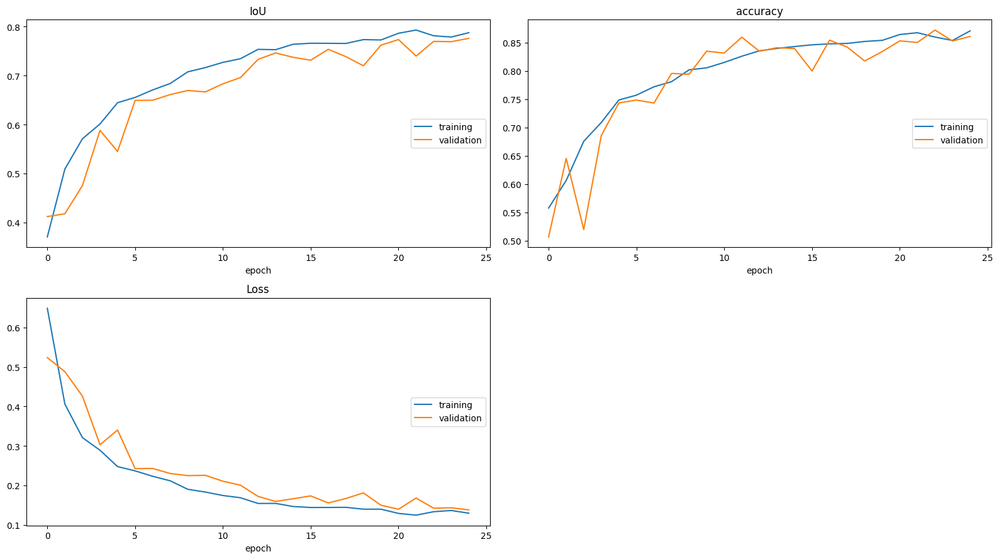

IoU
	training         	 (min:    0.371, max:    0.793, cur:    0.787)
	validation       	 (min:    0.412, max:    0.776, cur:    0.776)
accuracy
	training         	 (min:    0.558, max:    0.871, cur:    0.871)
	validation       	 (min:    0.507, max:    0.872, cur:    0.861)
Loss
	training         	 (min:    0.125, max:    0.649, cur:    0.130)
	validation       	 (min:    0.138, max:    0.524, cur:    0.138)
Model Improved. Saving...Done.



In [23]:
main(
   model = model,
   optimizer = optimizer,
   ckpt_dir = CKPT_DIR,
   device  = DEVICE,
   pin_memory = GPU_AVAILABLE
)

# Load checkpoint và inference model

In [36]:
DEVICE, GPU_AVAILABLE = get_default_device()
trained_model = UNETR(input_dim=3, output_dim=4)

checkpoint = torch.load(
    "/kaggle/working/model_checkpoint/3D_UNet_Brats2023/version_0/ckpt.tar", 
    map_location="cpu", 
    weights_only=True  # Giảm rủi ro bảo mật
)['model']

trained_model.load_state_dict(checkpoint, strict=False)

# missing_keys, unexpected_keys = trained_model.load_state_dict(checkpoint, strict=False)
# print("Missing keys:", missing_keys)  # Các tham số bị thiếu trong checkpoint
# print("Unexpected keys:", unexpected_keys)  # Các tham số dư thừa trong checkpoint

trained_model.to(DEVICE)
trained_model.eval()

Missing keys: ['conv1.0.weight', 'conv1.0.bias', 'conv1.1.weight', 'conv1.1.bias', 'conv1.1.running_mean', 'conv1.1.running_var', 'conv1.4.weight', 'conv1.4.bias', 'conv1.5.weight', 'conv1.5.bias', 'conv1.5.running_mean', 'conv1.5.running_var', 'conv2.0.weight', 'conv2.0.bias', 'conv2.1.weight', 'conv2.1.bias', 'conv2.1.running_mean', 'conv2.1.running_var', 'conv2.4.weight', 'conv2.4.bias', 'conv2.5.weight', 'conv2.5.bias', 'conv2.5.running_mean', 'conv2.5.running_var', 'conv3.0.weight', 'conv3.0.bias', 'conv3.1.weight', 'conv3.1.bias', 'conv3.1.running_mean', 'conv3.1.running_var', 'conv3.4.weight', 'conv3.4.bias', 'conv3.5.weight', 'conv3.5.bias', 'conv3.5.running_mean', 'conv3.5.running_var', 'conv4.0.weight', 'conv4.0.bias', 'conv4.1.weight', 'conv4.1.bias', 'conv4.1.running_mean', 'conv4.1.running_var', 'conv4.4.weight', 'conv4.4.bias', 'conv4.5.weight', 'conv4.5.bias', 'conv4.5.running_mean', 'conv4.5.running_var', 'conv5.0.weight', 'conv5.0.bias', 'conv5.1.weight', 'conv5.1.bias

UNETR(
  (conv1): Sequential(
    (0): Conv3d(3, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (5): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
  )
  (pool1): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Sequential(
    (0): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (5): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    

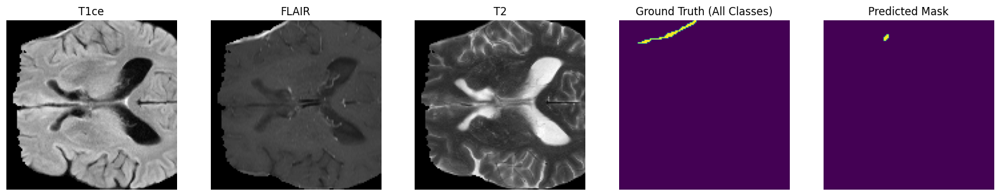

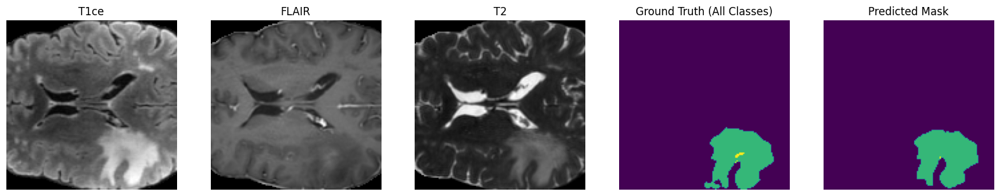

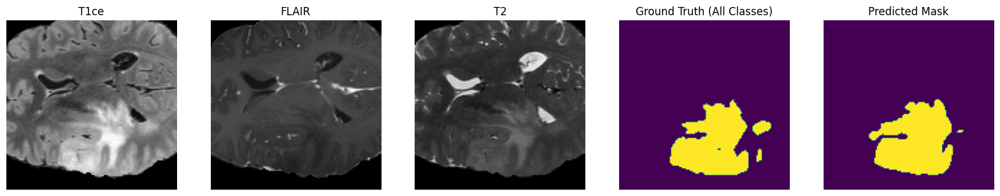

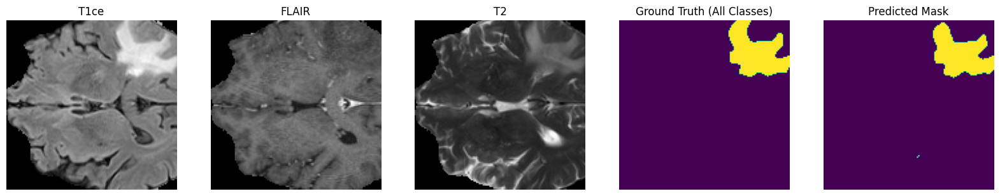

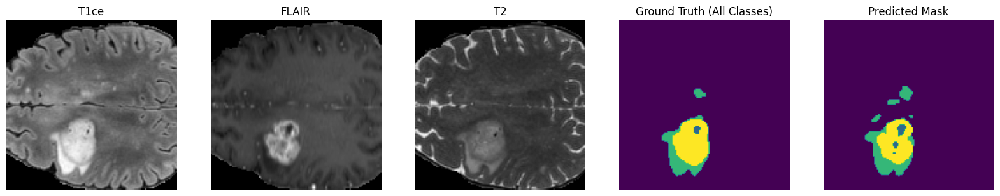

...

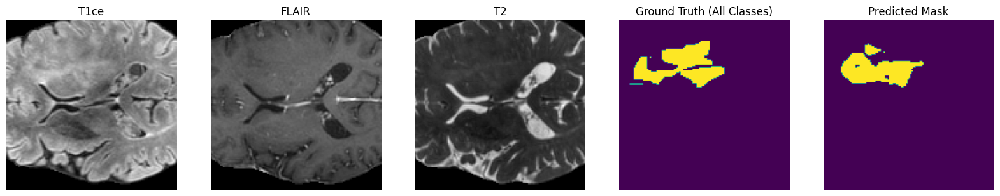

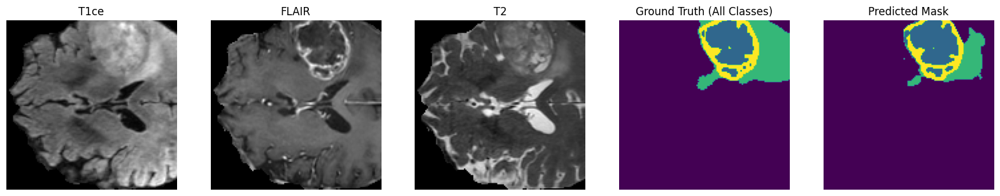

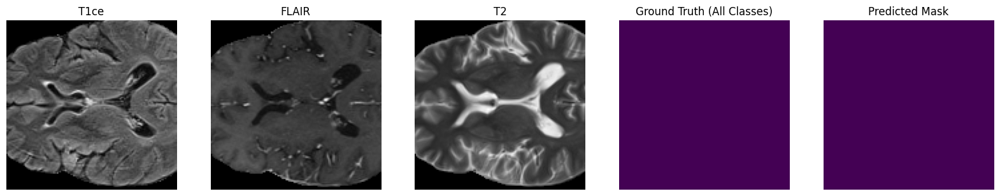

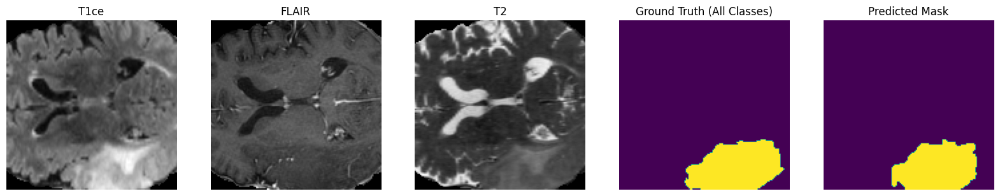

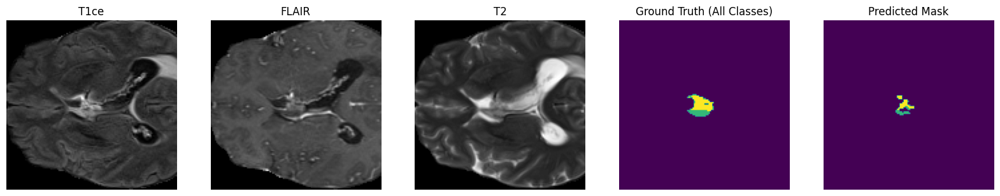

In [37]:
@torch.inference_mode()
def inference(model, loader, device="cpu", num_batches_to_process=8):
    for idx, (batch_img, batch_mask) in enumerate(loader):
 
        # Move batch images to the device (CPU or GPU)
        batch_img = batch_img.to(device).float()
        # Get the predictions from the model
        pred_all = model(batch_img)
 
        # Move the predictions to CPU and apply argmax to get predicted classes
        pred_all = pred_all.cpu().argmax(dim=1).numpy()
        # Optionally break after processing a fixed number of batches
        if idx == num_batches_to_process:
            break
 
        # Visualize images and predictions
        for i in range(0, len(batch_img)):
            fig, ax = plt.subplots(1, 5, figsize=(20, 8))
            middle_slice = batch_img.shape[2] // 2  # Along Depth
            # Visualize different modalities (e.g., T1ce, FLAIR, T2)
            ax[0].imshow(batch_img[i, 0, middle_slice, :, :].cpu().numpy(), cmap="gray")
            ax[1].imshow(batch_img[i, 1, middle_slice, :, :].cpu().numpy(), cmap="gray")
            ax[2].imshow(batch_img[i, 2, middle_slice, :, :].cpu().numpy(), cmap="gray")
 
            # Get the ground truth mask as class indices using argmax (combine all classes)
            gt_combined = (
                batch_mask[i, :, middle_slice, :, :].argmax(dim=0).cpu().numpy()
            )
 
            # Visualize the ground truth mask
            ax[3].imshow(gt_combined, cmap="viridis")
            ax[3].set_title("Ground Truth (All Classes)")
            # Visualize the predicted mask
            ax[4].imshow(pred_all[i, middle_slice, :, :], cmap="viridis")
            ax[4].set_title("Predicted Mask")
 
            # Set titles for the image subplot
            ax[0].set_title("T1ce")
            ax[1].set_title("FLAIR")
            ax[2].set_title("T2")
 
            # Turn off axis for all subplots
            for a in ax:
                a.axis("off")
            # Show the plot
            plt.show()
 
 
# Run inference
inference(model, val_loader, device="cuda", num_batches_to_process=12)